# Kannda MNIST Classification Project

## Kannda MNIST Classification using Random Forest Classifier

In [ ]:
!pip install streamlit pyngrok mlflow

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Understand the dataset


#### Load the Kannada MNIST dataset

In [34]:
import numpy as np
# Step 1: Load the Kannada MNIST dataset
data = np.load("/content/drive/MyDrive/data/Kannada_MNIST_datataset_paper/Kannada_MNIST_npz/Kannada_MNIST/X_kannada_MNIST_train.npz")["arr_0"]
label = np.load("/content/drive/MyDrive/data/Kannada_MNIST_datataset_paper/Kannada_MNIST_npz/Kannada_MNIST/y_kannada_MNIST_train.npz")["arr_0"]


- `np.load("file_path")`: This function call loads the data stored in the NPZ file located at the specified path.


- `["arr_0"]`: This indexing operation retrieves the data associated with the key "arr_0" from the NPZ file.

#### Size of data & label

In [ ]:
print('Training data shape:', data.shape)
print('Label shape:', label.shape)

Training data shape: (60000, 28, 28)
Label shape: (60000,)


- In this case of the Kannada MNIST dataset, the original data shape is (60000, 28, 28),
- and the label shape is (60000,).


>>  60000 represents the number of samples or images in the dataset.


>> (28, 28) represents the dimensions of each image,
where each image is 28 pixels in height and 28 pixels in width.







#### Sample image view

In [ ]:
#sample image
selected_index = 0

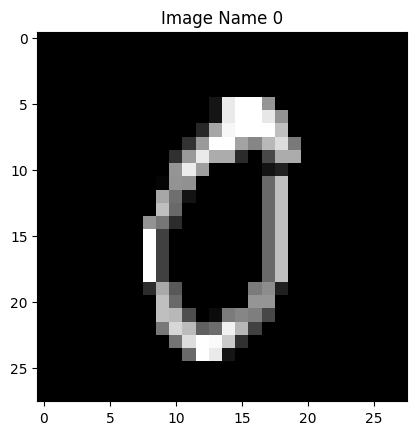

In [ ]:
import matplotlib.pyplot as plt
#show image from training data
plt.imshow(data[selected_index], cmap='gray')
plt.title(f'Image Name {label[selected_index]}')
plt.show()

In [ ]:
# Check the range of pixel intensity values
min_intensity = np.min(data[selected_index])
max_intensity = np.max(data[selected_index])

print("Minimum Pixel Intensity:", min_intensity)
print("Maximum Pixel Intensity:", max_intensity)

Minimum Pixel Intensity: 0
Maximum Pixel Intensity: 255


- **Pixel Intensity Values**: As grayscale images, each pixel in an MNIST image has an intensity value ranging from 0 to 255. A pixel with a value of 0 represents black, while a pixel with a value of 255 represents white. The values in between represent various shades of gray
_means higher the value more the shade of gray_

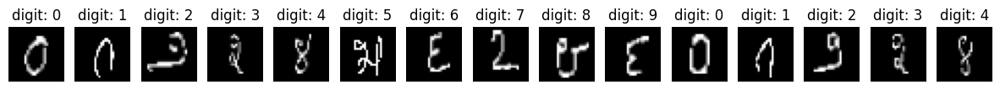

In [35]:
# Display the first few images side by side
num_images_to_display = 15

fig, axes = plt.subplots(1, num_images_to_display, figsize=(15, 3))

for i in range(num_images_to_display):
    axes[i].imshow(data[i], cmap='gray')
    axes[i].set_title(f'digit: {label[i]}')
    axes[i].axis('off')

plt.show()

- **Labeling**: Each image in the dataset is associated with a label indicating the digit it represents. The labels range from 0 to 9, corresponding to the digits 0 through 9.

### Pre Process the dataset

#### Flattenig of image
- When the data is flattened, each image is converted from a 28x28 matrix into a 1D array of length 784 (28*28). As a result, each image becomes a single row in the dataset, and each pixel in the image becomes a feature.

In [ ]:
# Flatten the image data
data = data.reshape(data.shape[0], -1)

print('Training data shape:', data.shape)

Training data shape: (60000, 784)


- By flattening the data before splitting it into training and testing sets, we ensure that each sample in the dataset has the same number of features. This allows us to use the train-test split function from scikit-learn without encountering any compatibility issues.

#### Split the dataset into training and testing sets

In [ ]:
from sklearn.model_selection import train_test_split
# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(data, label, test_size=0.2, random_state=42)

- here test size is 20% of the dataset and random state is 42.

- random state is used to ensure that the same dataset is used for training and testing in the same run.

#### Standardize the data

In [ ]:
from sklearn.preprocessing import MinMaxScaler
# Standardize the data
scaler = MinMaxScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

- For the MNIST dataset, which contains pixel intensity values ranging from 0 to 255,
- MinMaxScaler might be more suitable as it scales the features to a fixed range (0 to 1), which could help some algorithms converge faster or perform better


`Decision Trees` and `Random Forests` are generally _not affected by scaling or PCA._ Naive Bayes is not significantly affected either. However, **K-NN and SVM benefit from MinMax scaling** to ensure equal contribution of features to the model and to improve the performance of distance-based calculations.

#### PCA

PCA is a dimensionality reduction technique that reduces the dimensionality of the data by projecting it onto a new set of axes that are orthogonal (uncorrelated) and are arranged in descending order of importance or variance.

In [ ]:
from sklearn.decomposition import PCA
# Apply PCA
pca = PCA(n_components=10)  # Reduce to 10 components
X_train_pca = pca.fit_transform(X_train_std)
X_test_pca = pca.transform(X_test_std)
print(pca.explained_variance_ratio_)

[0.07982275 0.055719   0.04471264 0.03655333 0.03436331 0.02777944
 0.0244022  0.02094377 0.02043442 0.01728027]


Each value in the array represents the proportion of variance explained by the corresponding principal component. Typically, you would use this information to understand how much of the total variance in the data is captured by each principal component. It helps in deciding how many principal components to retain for dimensionality reduction or feature extraction purposes

##### Visualization

In [36]:
import plotly.express as px
fig = px.scatter(X_train_pca, x=0, y=1, color= y_train)
fig.show()

In [ ]:
import plotly.express as px
from sklearn.decomposition import PCA

df = px.data.iris()
features = ["sepal_width", "sepal_length", "petal_width", "petal_length"]

pca = PCA()
components = pca.fit_transform(X_train_std)
labels = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca.explained_variance_ratio_ * 100)
}

fig = px.scatter_matrix(
    components,
    labels=labels,
    dimensions=range(4),
    color= y_train,
)
fig.update_traces(diagonal_visible=False)
fig.show()

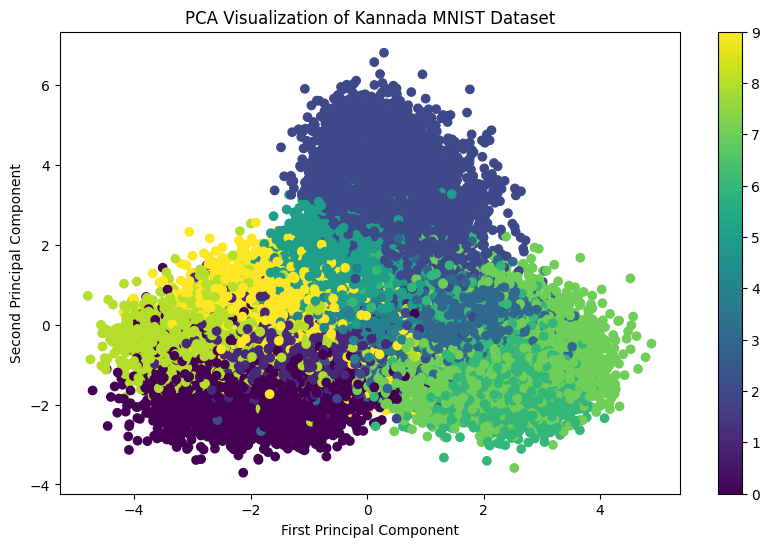

In [ ]:
import matplotlib.pyplot as plt

#y_train contains the true labels for the training data
plt.figure(figsize=(10, 6))
plt.scatter(X_train_pca[:, 0], X_train_pca[:, 1], c=y_train, cmap='viridis')
plt.xlabel('First Principal Component')
plt.ylabel('Second Principal Component')
plt.title('PCA Visualization of Kannada MNIST Dataset')
plt.colorbar()
plt.show()

- dimensionality reduction technique that is often used to simplify the complexity in high-dimensional data while retaining trends and patterns

### Training the Model

#### Random Forest Model Training

In [ ]:
from sklearn.ensemble import RandomForestClassifier
# Train the RandomForestClassifier on the transformed data
model = RandomForestClassifier()
model.fit(X_train_pca, y_train)


RandomForestClassifier()

####Evaluating the Model

In [ ]:
# Evaluate the model
y_pred = model.predict(X_test_pca)

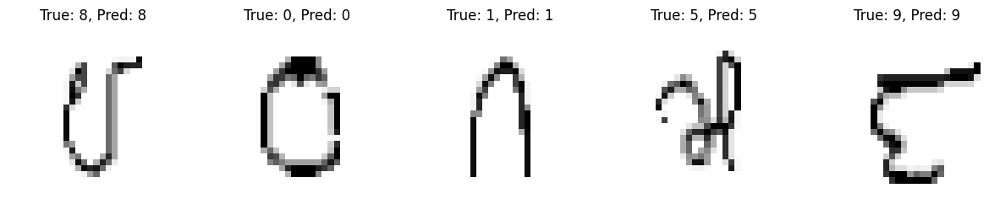

In [ ]:
import matplotlib.pyplot as plt
# Visualize the prediction for a few test samples
_, axes = plt.subplots(nrows=1, ncols=5, figsize=(15, 3))
for ax, image, prediction, label in zip(axes, X_test, y_pred, y_test):
    ax.set_axis_off()
    image = image.reshape(28, 28)
    ax.imshow(image, cmap=plt.cm.gray_r, interpolation="nearest")
    ax.set_title(f"True: {label}, Pred: {prediction}")

##### Calculate Accuracy, Precision, Recall, and F1 Score

In [ ]:
print('sample of predicted labels:',y_pred[0:10])
print('sample of real labels:',y_test[0:10])

accuarate_samples = np.sum(y_pred == y_test)
total_samples = len(y_test)
print("Number of accurate samples:", accuarate_samples)
print("Total number of samples:", total_samples)

accuracy = accuarate_samples / total_samples

print("Accuracy:", accuracy)

sample of predicted labels: [8 0 1 5 9 2 1 7 6 2]
sample of real labels: [8 0 1 5 9 2 1 7 6 2]
Number of accurate samples: 11445
Total number of samples: 12000
Accuracy: 0.95375


In [ ]:
# True Positives (TP):
TP = np.sum((y_test == 1) & (y_pred == 1))
# True Negatives (TN):
TN = np.sum((y_test == 0) & (y_pred == 0))
# False Positives (FP):
FP = np.sum((y_test == 0) & (y_pred == 1))
# False Negatives (FN):
FN = np.sum((y_test == 1) & (y_pred == 0))

# Precision: TP / (TP + FP)
precision = TP / (TP + FP) if TP + FP > 0 else 0

# Recall: TP / (TP + FN)
recall = TP / (TP + FN) if TP + FN > 0 else 0

# F1 Score: 2 * (precision * recall) / (precision + recall)
f1_score = 2 * (precision * recall) / (precision + recall) if precision + recall > 0 else 0

print("Precision: ", precision)
print("Recall: ", recall)
print("F1 Score: ", f1_score)

Precision:  0.9564516129032258
Recall:  0.9826014913007457
F1 Score:  0.9693502247650183


##### Experiment with Different Component Sizes

In [ ]:
from sklearn.metrics import classification_report
from time import time

# List of PCA component sizes to try
pca_components = [5, 10, 15, 20, 25, 30, 35, 40, 45, 50]

# Dictionary to store the results
results = {}

# Loop over the PCA component sizes
for n_components in pca_components:

    # Apply PCA
    pca = PCA(n_components=n_components)
    X_train_pca = pca.fit_transform(X_train)
    X_test_pca = pca.transform(X_test)
    pca_var = pca.explained_variance_ratio_

    # Train the RandomForestClassifier on the transformed data
    model = RandomForestClassifier()
    start_time = time()
    model.fit(X_train_pca, y_train)
    end_time = time()
    training_time = end_time - start_time

    # Evaluate the model
    y_pred = model.predict(X_test_pca)
    report = classification_report(y_test, y_pred)


    print(f"Report for PCA with {n_components} components:------{model.__class__.__name__}---------")
    print(f'-----------------------------------Training Time: {training_time:.4f} seconds \n')
    print(report)
    print(f'----{n_components} components-----------------PCA Variance: {pca_var}\n\n')

    # Store the results
    results[n_components] = {'classification_report': report,'training_time': training_time, 'pca_var': pca_var}


Report for PCA with 5 components:------RandomForestClassifier---------
-----------------------------------Training Time: 17.6334 seconds 

              precision    recall  f1-score   support

           0       0.89      0.88      0.89      1177
           1       0.90      0.92      0.91      1218
           2       0.97      0.96      0.97      1224
           3       0.87      0.89      0.88      1184
           4       0.91      0.92      0.91      1221
           5       0.89      0.91      0.90      1188
           6       0.83      0.87      0.85      1169
           7       0.81      0.78      0.80      1219
           8       0.91      0.92      0.92      1186
           9       0.92      0.87      0.90      1214

    accuracy                           0.89     12000
   macro avg       0.89      0.89      0.89     12000
weighted avg       0.89      0.89      0.89     12000

----5 components-----------------PCA Variance: [0.07982275 0.055719   0.04471264 0.03655333 0.03436331

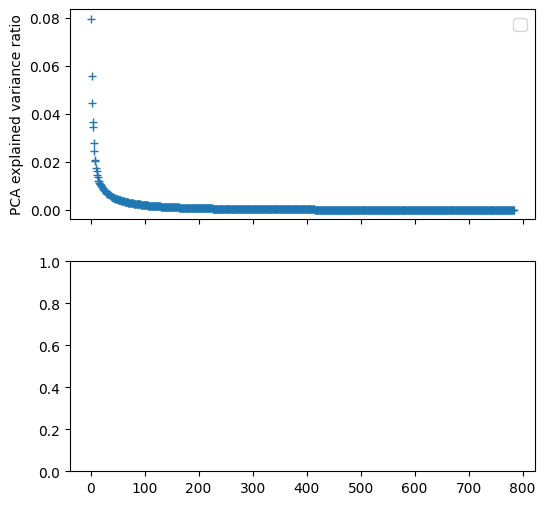

In [30]:
# Plot the PCA spectrum
pca.fit(data)

fig, (ax0, ax1) = plt.subplots(nrows=2, sharex=True, figsize=(6, 6))
ax0.plot(
    np.arange(1, pca.n_components_ + 1), pca.explained_variance_ratio_, "+", linewidth=2
)
ax0.set_ylabel("PCA explained variance ratio")

# ax0.axvline(
#     search.best_estimator_.named_steps["pca"].n_components,
#     linestyle=":",
#     label="n_components chosen",
# )
ax0.legend(prop=dict(size=12))

## Multi Model comparison on Kannada MNIST

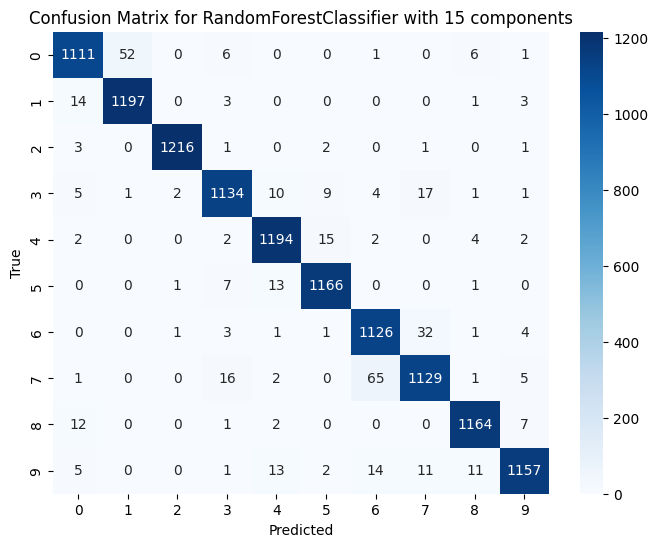

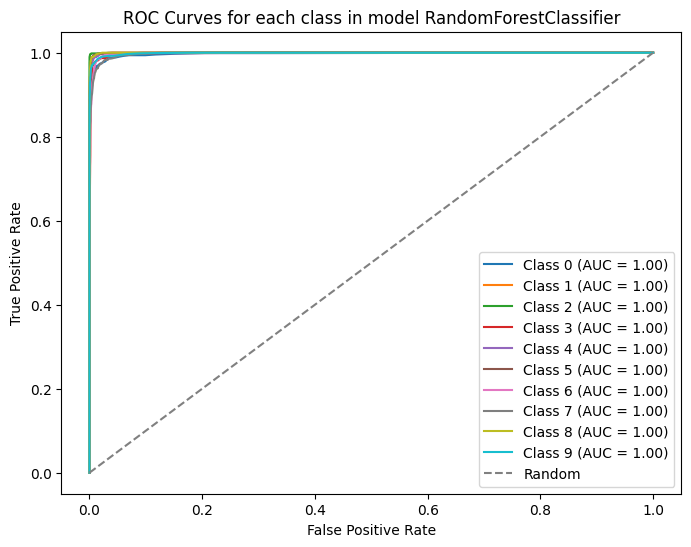

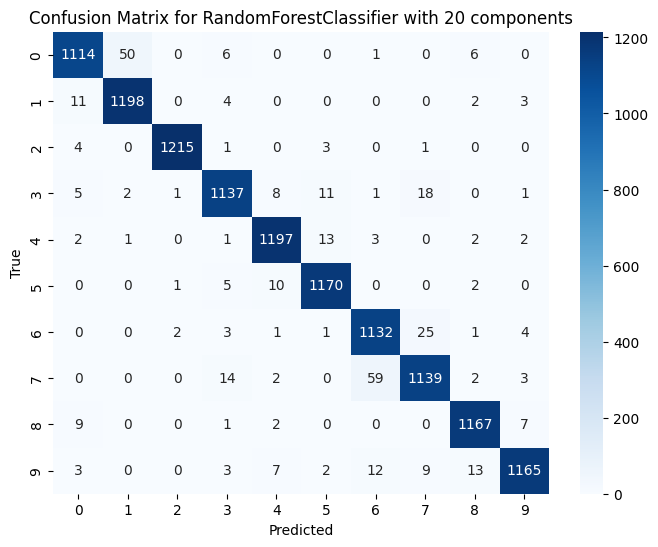

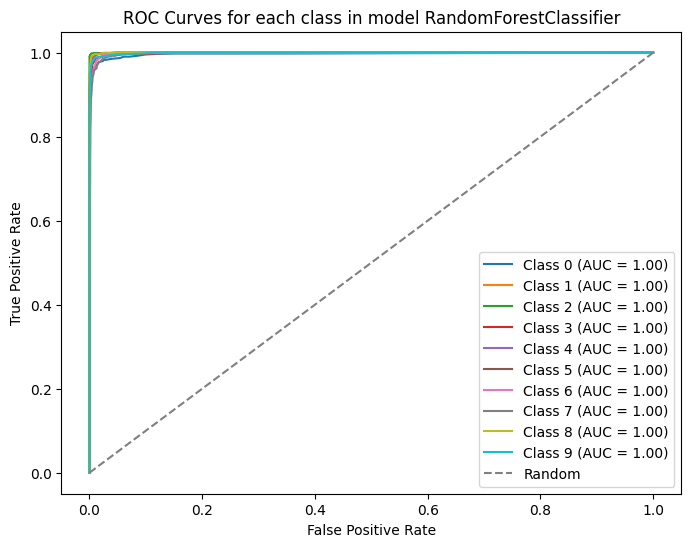

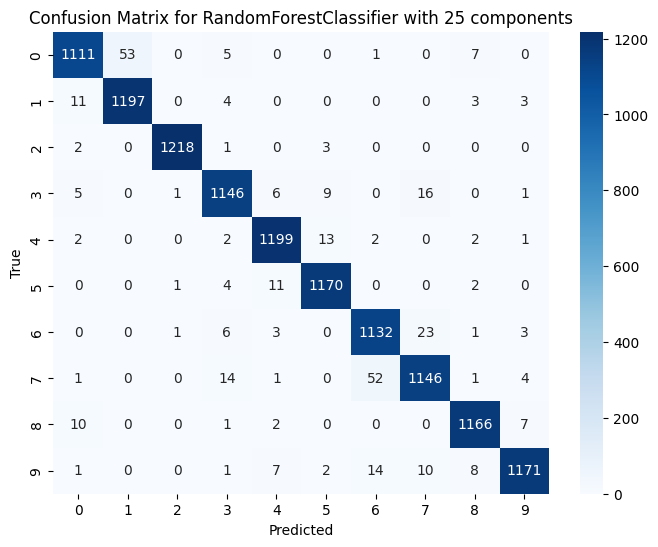

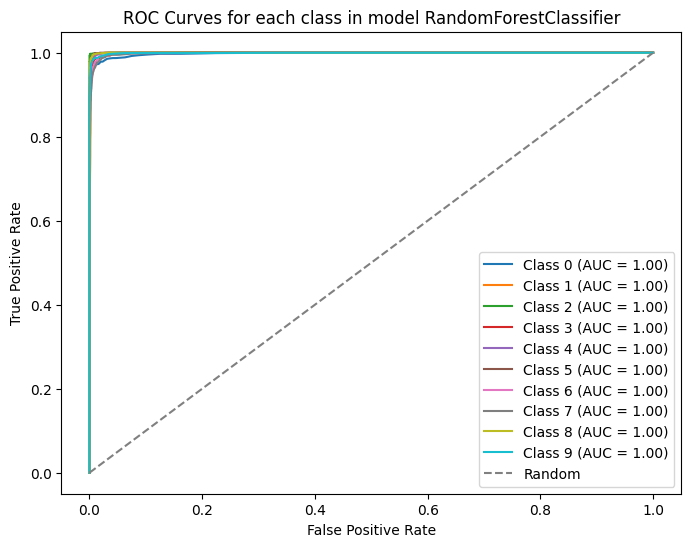

Classification Report for RandomForestClassifier with 15 components:
              precision    recall  f1-score   support

           0       0.97      0.94      0.96      1177
           1       0.96      0.98      0.97      1218
           2       1.00      1.00      1.00      1224
           3       0.97      0.97      0.97      1184
           4       0.98      0.98      0.98      1221
           5       0.98      0.98      0.98      1188
           6       0.94      0.97      0.96      1169
           7       0.96      0.94      0.95      1219
           8       0.98      0.98      0.98      1186
           9       0.98      0.96      0.97      1214

    accuracy                           0.97     12000
   macro avg       0.97      0.97      0.97     12000
weighted avg       0.97      0.97      0.97     12000

Classification Report for RandomForestClassifier with 20 components:
              precision    recall  f1-score   support

           0       0.97      0.94      0.96     

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score, roc_curve, auc, confusion_matrix, classification_report
)
from time import time

# List of PCA component sizes to try
pca_components = [15, 20, 25]

# Function to plot ROC curves
def plot_roc_curves(roc_auc_data, model_name):
    plt.figure(figsize=(8, 6))
    for i in range(roc_auc_data["n_classes"]):
        plt.plot(
            roc_auc_data["fpr"][i], roc_auc_data["tpr"][i],
            label=f'Class {roc_auc_data["class_names"][i]} (AUC = {roc_auc_data["roc_auc"][i]:.2f})'
        )
    plt.plot([0, 1], [0, 1], linestyle="--", color="grey", label="Random")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title(f"ROC Curves for each class in model {model_name}")
    plt.legend()
    plt.show()

# Function to plot confusion matrix
def plot_confusion_matrix(conf_matrix, class_names, title):
    plt.figure(figsize=(8, 6))
    sns.heatmap(
        conf_matrix, annot=True, fmt="g", cmap="Blues",
        xticklabels=class_names, yticklabels=class_names
    )
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title(f"{title}")
    plt.show()

# Dictionary to store the results
results = {}

# Loop over the PCA component sizes
for n_components in pca_components:
    # Apply PCA
    pca = PCA(n_components=n_components)
    X_train_pca = pca.fit_transform(X_train)
    X_test_pca = pca.transform(X_test)
    pca_var = pca.explained_variance_ratio_

    # Train the RandomForestClassifier on the transformed data
    model = RandomForestClassifier()
    start_time = time()
    model.fit(X_train_pca, y_train)
    end_time = time()
    training_time = end_time - start_time
    model_name = model.__class__.__name__

    # Evaluate the model
    y_pred = model.predict(X_test_pca)
    y_prob = model.predict_proba(X_test_pca)

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')  # Use 'weighted' for weighted averages
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    conf_matrix = confusion_matrix(y_test, y_pred)


    # Plot confusion matrix
    plot_confusion_matrix(conf_matrix, np.unique(y_test), f"Confusion Matrix for {model_name} with {n_components} components")

    # Plot ROC curves
    roc_auc_data = {
        "n_classes": len(np.unique(y_test)),
        "fpr": dict(),
        "tpr": dict(),
        "roc_auc": dict(),
        "class_names": np.unique(y_test)
    }
    for i in range(len(np.unique(y_test))):
        roc_auc_data["fpr"][i], roc_auc_data["tpr"][i], _ = roc_curve(y_test == i, y_prob[:, i])
        roc_auc_data["roc_auc"][i] = auc(roc_auc_data["fpr"][i], roc_auc_data["tpr"][i])
    plot_roc_curves(roc_auc_data, model_name)

    # Store results
    results[n_components] = {
        "model_name": model_name,
        "training_time": training_time,
        "accuracy": accuracy,
        "precision": precision,
        "recall": recall,
        "f1": f1,
        "confusion_matrix": conf_matrix,
        "roc_auc_data": roc_auc_data
    }



In [ ]:
# Print the classification report for each PCA component size
for n_components, result in results.items():
    print(f"Classification Report for {result['model_name']} with {n_components} components:")
    print(classification_report(y_test, model.predict(X_test_pca)))

In [ ]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
from time import time

import numpy as np
# Step 1: Load the Kannada MNIST dataset
data = np.load("/content/drive/MyDrive/data/Kannada_MNIST_datataset_paper/Kannada_MNIST_npz/Kannada_MNIST/X_kannada_MNIST_train.npz")["arr_0"]
label = np.load("/content/drive/MyDrive/data/Kannada_MNIST_datataset_paper/Kannada_MNIST_npz/Kannada_MNIST/y_kannada_MNIST_train.npz")["arr_0"]


# Flatten the image data
data = data.reshape(data.shape[0], -1)


# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(data, label, test_size=0.2, random_state=42)

# Standardize the data
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# List of PCA component sizes to try
pca_components = [10, 15, 20, 25, 30]

# Dictionary to store the results
results = {}

# Models to train
models = {
    'Decision Tree': DecisionTreeClassifier(),
    'Random Forest': RandomForestClassifier(),
    'Naive Bayes': GaussianNB(),
    'K-Nearest Neighbors': KNeighborsClassifier(),
    'Support Vector Machine': SVC()
}

# Loop over the PCA component sizes
for n_components in pca_components:
    # Apply PCA
    pca = PCA(n_components=n_components)
    X_train_pca = pca.fit_transform(X_train)
    X_test_pca = pca.transform(X_test)

    # Train each model on the transformed data
    for model_name, model in models.items():
        # Train the model
        start_time = time()
        model.fit(X_train_pca, y_train)
        end_time = time()
        training_time = end_time - start_time

        # Evaluate the model
        y_pred = model.predict(X_test_pca)
        accuracy = accuracy_score(y_test, y_pred)

        # Store the results
        if model_name not in results:
            results[model_name] = {}
        results[model_name][n_components] = {'accuracy': accuracy, 'training_time': training_time}



In [ ]:
# Print the results
for model_name, model_results in results.items():
    print(f"Results for {model_name}:")
    for n_components, metrics in model_results.items():
        print(f"PCA with {n_components} components - Accuracy: {metrics['accuracy']:.4f}, Training Time: {metrics['training_time']:.4f} seconds")
    print()

Scaler saved as scaler.pkl
PCA saved as pca.pkl
Accuracy: 0.9509166666666666
Model saved as random_forest_model_with_pca.pkl


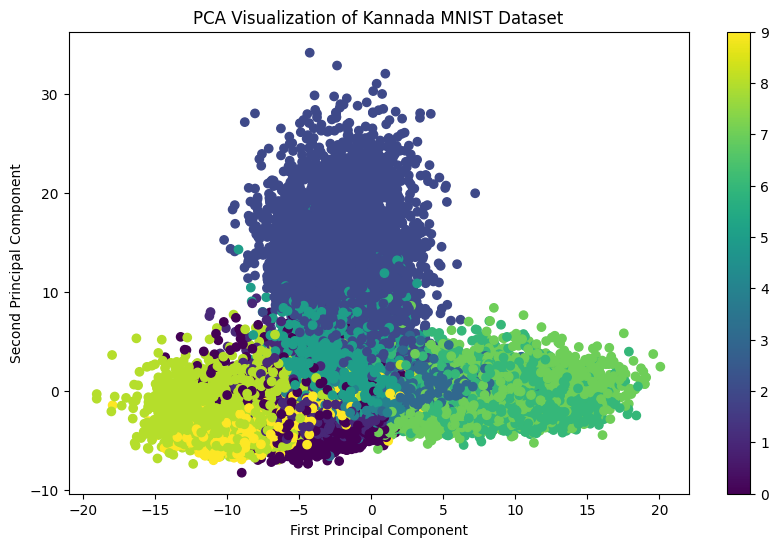

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import joblib

# Step 1: Load the Kannada MNIST dataset
data = np.load("/content/drive/MyDrive/data/Kannada_MNIST_datataset_paper/Kannada_MNIST_npz/Kannada_MNIST/X_kannada_MNIST_train.npz")["arr_0"]
label = np.load("/content/drive/MyDrive/data/Kannada_MNIST_datataset_paper/Kannada_MNIST_npz/Kannada_MNIST/y_kannada_MNIST_train.npz")["arr_0"]

# Flatten the image data
data = data.reshape(data.shape[0], -1)

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(data, label, test_size=0.2, random_state=42)

# Step 2: Standardize the data
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Save the scaler object
scaler_filename = "scaler.pkl"
joblib.dump(scaler, scaler_filename)
print("Scaler saved as", scaler_filename)



# Step 3: Apply PCA
pca = PCA(n_components=10)  # Reduce to 10 components
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

# Save the PCA object
pca_filename = "pca.pkl"
joblib.dump(pca, pca_filename)
print("PCA saved as", pca_filename)

# Step 4: Train the RandomForestClassifier on the transformed data
clf = RandomForestClassifier()
clf.fit(X_train_pca, y_train)

# Step 5: Evaluate the model
y_pred = clf.predict(X_test_pca)
accuracy = np.sum(y_pred == y_test) / len(y_test)
print("Accuracy:", accuracy)

# Step 6: Save the trained model
model_filename = "random_forest_model_with_pca.pkl"
joblib.dump(clf, model_filename)
print("Model saved as", model_filename)

# Step 7: Visualize the results
plt.figure(figsize=(10, 6))
plt.scatter(X_train_pca[:, 0], X_train_pca[:, 1], c=y_train, cmap='viridis')
plt.xlabel('First Principal Component')
plt.ylabel('Second Principal Component')
plt.title('PCA Visualization of Kannada MNIST Dataset')
plt.colorbar()
plt.show()

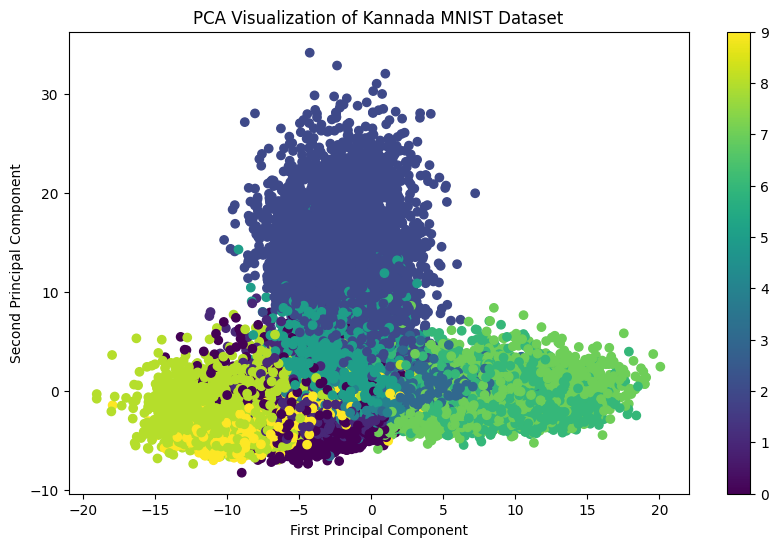

In [ ]:
import matplotlib.pyplot as plt

# Assuming y_train contains the true labels for the training data
plt.figure(figsize=(10, 6))
plt.scatter(X_train_pca[:, 0], X_train_pca[:, 1], c=y_train, cmap='viridis')
plt.xlabel('First Principal Component')
plt.ylabel('Second Principal Component')
plt.title('PCA Visualization of Kannada MNIST Dataset')
plt.colorbar()
plt.show()

In [ ]:
from sklearn.decomposition import PCA

# Step 3: Apply PCA
pca = PCA(n_components=10)  # Reduce to 10 components
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)
print(pca.explained_variance_ratio_)

[0.04549564 0.03876751 0.02966483 0.02171064 0.02063723 0.01838234
 0.01500667 0.0134978  0.01282826 0.01110519]


In [ ]:
import streamlit as st
import numpy as np
from PIL import Image
import joblib

# Load the trained model, PCA, and StandardScaler
model_filename = "random_forest_model_with_pca.pkl"
pca_filename = "pca.pkl"
scaler_filename = "scaler.pkl"

clf = joblib.load(model_filename)
pca = joblib.load(pca_filename)
scaler = joblib.load(scaler_filename)

# Define the Streamlit app
def main():
    st.title("Kannada MNIST Classifier with PCA")

    # Add a file uploader to upload an image
    uploaded_file = st.file_uploader("Upload an image of a Kannada digit", type=["png", "jpg", "jpeg"])

    if uploaded_file is not None:
        # Display the uploaded image
        image = Image.open(uploaded_file).convert('L')  # Convert to grayscale
        st.image(image, caption='Uploaded Image.', use_column_width=True)

        # Preprocess the image
        image = image.resize((28, 28))  # Resize to 28x28 pixels
        image_array = np.array(image).reshape(1, -1)  # Flatten the image
        image_array = scaler.transform(image_array)  # Standardize the image
        image_array = pca.transform(image_array)  # Apply PCA

        # Make predictions
        prediction = clf.predict(image_array)

        # Display the prediction
        st.write(f"Prediction: {prediction[0]}")

if __name__ == '__main__':
    main()

Accuracy: 0.9680833333333333
Model saved as random_forest_model_with_pca.pkl


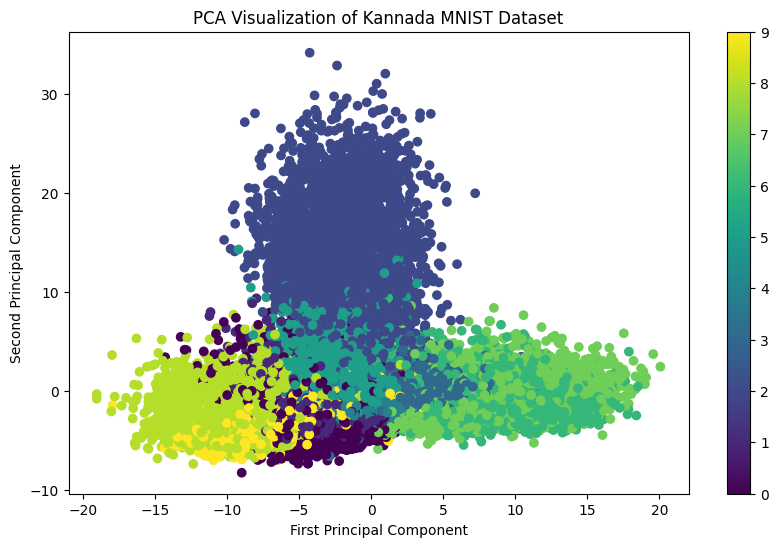

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import joblib

# Step 1: Load the Kannada MNIST dataset
data = np.load("/content/drive/MyDrive/data/Kannada_MNIST_datataset_paper/Kannada_MNIST_npz/Kannada_MNIST/X_kannada_MNIST_train.npz")["arr_0"]
label = np.load("/content/drive/MyDrive/data/Kannada_MNIST_datataset_paper/Kannada_MNIST_npz/Kannada_MNIST/y_kannada_MNIST_train.npz")["arr_0"]

# Flatten the image data
data = data.reshape(data.shape[0], -1)

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(data, label, test_size=0.2, random_state=42)

# Step 2: Standardize the data
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Step 3: Apply PCA
pca = PCA(n_components=0.95)  # Retain 95% of the variance
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

# Step 4: Train the RandomForestClassifier on the transformed data
clf = RandomForestClassifier()
clf.fit(X_train_pca, y_train)

# Step 5: Evaluate the model
y_pred = clf.predict(X_test_pca)
accuracy = np.sum(y_pred == y_test) / len(y_test)
print("Accuracy:", accuracy)

# Step 6: Save the trained model
model_filename = "random_forest_model_with_pca.pkl"
joblib.dump(clf, model_filename)
print("Model saved as", model_filename)

# Step 7: Visualize the results
plt.figure(figsize=(10, 6))
plt.scatter(X_train_pca[:, 0], X_train_pca[:, 1], c=y_train, cmap='viridis')
plt.xlabel('First Principal Component')
plt.ylabel('Second Principal Component')
plt.title('PCA Visualization of Kannada MNIST Dataset')
plt.colorbar()
plt.show()

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Step 7: Visualize the results in 3D
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Ensure you have at least three principal components
if X_train_pca.shape[1] >= 3:
    ax.scatter(X_train_pca[:, 0], X_train_pca[:, 1], X_train_pca[:, 2], c=y_train, cmap='viridis')
    ax.set_xlabel('First Principal Component')
    ax.set_ylabel('Second Principal Component')
    ax.set_zlabel('Third Principal Component')
    ax.set_title('PCA Visualization of Kannada MNIST Dataset')
    plt.show()
else:
    print("Not enough principal components to create a 3D plot.")

In [ ]:
import streamlit as st
import numpy as np
from sklearn.ensemble import RandomForestClassifier
import joblib
from PIL import Image

# Load the trained model
model_filename = "random_forest_model.pkl"
clf = joblib.load(model_filename)

# Define the Streamlit app
def main():
    st.title("Kannada MNIST Classifier")

    # Add a file uploader to upload an image
    image = st.file_uploader("Upload an image of a Kannada digit", type=["png", "jpg"])

    if image is not None:
        # Display the uploaded image
        st.image(image, caption='Uploaded Image.', use_column_width=True)

        # Convert the image file to grayscale and resize it to 28x28 pixels
        image = Image.open(image).convert('L').resize((28, 28))

        # Convert the image to a numpy array and flatten it
        image_array = np.array(image).flatten().reshape(1, -1)

        # Make predictions
        prediction = clf.predict(image_array)

        # Display the prediction
        st.write(f"Prediction: {prediction[0]}")

if __name__ == '__main__':
    main()

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
import joblib

# Step 1: Load the Kannada MNIST dataset
data = np.load("/content/drive/MyDrive/data/Kannada_MNIST_datataset_paper/Kannada_MNIST_npz/Kannada_MNIST/X_kannada_MNIST_train.npz")["arr_0"]
label = np.load("/content/drive/MyDrive/data/Kannada_MNIST_datataset_paper/Kannada_MNIST_npz/Kannada_MNIST/y_kannada_MNIST_train.npz")["arr_0"]

# Flatten the image data
data = data.reshape(data.shape[0], -1)

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(data, label, test_size=0.2, random_state=42)

# Step 2: Train the RandomForestClassifier
clf = RandomForestClassifier()
clf.fit(X_train, y_train)

# Step 3: Evaluate the model
y_pred = clf.predict(X_test)
accuracy = np.sum(y_pred == y_test) / len(y_test)
print("Accuracy:", accuracy)

# Step 4: Save the trained model
model_filename = "random_forest_model.pkl"
joblib.dump(clf, model_filename)
print("Model saved as", model_filename)


Accuracy: 0.98075
Model saved as random_forest_model.pkl


In [ ]:
import streamlit as st
import numpy as np
from sklearn.ensemble import RandomForestClassifier
import joblib
from PIL import Image

# Load the trained model
model_filename = "random_forest_model.pkl"
clf = joblib.load(model_filename)

# Define the Streamlit app
def main():
    st.title("Kannada MNIST Classifier")

    # Add a file uploader to upload an image
    image = st.file_uploader("Upload an image of a Kannada digit", type=["png", "jpg"])

    if image is not None:
        # Display the uploaded image
        st.image(image, caption='Uploaded Image.', use_column_width=True)

        # Convert the image file to numpy array
        image = np.array(Image.open(image).convert('L').resize((28, 28)))

        # Make predictions
        prediction = clf.predict(image.reshape(1, -1))

        # Display the prediction
        st.write(f"Prediction: {prediction[0]}")

if __name__ == '__main__':
    main()


In [ ]:
from pyngrok import ngrok
!ngrok authtoken 2ZjwOwRMWe1xdOQuhwti9eQTXBA_45bBvrKJqeZy7foGQgYWA

# Step 13: Start Streamlit in the background
get_ipython().system_raw('nohup streamlit run /content/deploy_scalar_pca_rf.py &')

# Use ngrok to create a public URL for the Streamlit app
ngrok_tunnel_streamlit = ngrok.connect(addr="8501", proto="http", bind_tls=True)

# Print the public URL for Streamlit app
print("Streamlit app can be accessed at:", ngrok_tunnel_streamlit.public_url)

Authtoken saved to configuration file: /root/.config/ngrok/ngrok.yml
Streamlit app can be accessed at: https://1212-34-23-23-240.ngrok-free.app


In [ ]:
!pkill streamlit

In [ ]:
y_predicted = model.predict(X_test[8].reshape(1,-1))

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
import matplotlib.pyplot as plt

In [ ]:
# Step 1: Data Loading
def load_data(file_path):
    data = np.load(file_path)
    return data["arr_0"]

# Step 2: Load Kannada MNIST dataset
train_file_path = "/content/drive/MyDrive/data/Kannada_MNIST_datataset_paper/Kannada_MNIST_npz/Kannada_MNIST/X_kannada_MNIST_train.npz"
test_file_path = "/content/drive/MyDrive/data/Kannada_MNIST_datataset_paper/Kannada_MNIST_npz/Kannada_MNIST/X_kannada_MNIST_test.npz"
label_train_file_path = "/content/drive/MyDrive/data/Kannada_MNIST_datataset_paper/Kannada_MNIST_npz/Kannada_MNIST/y_kannada_MNIST_train.npz"
label_test_file_path = "/content/drive/MyDrive/data/Kannada_MNIST_datataset_paper/Kannada_MNIST_npz/Kannada_MNIST/y_kannada_MNIST_test.npz"

X_train = load_data(train_file_path)
X_test = load_data(test_file_path)
y_train = load_data(label_train_file_path)
y_test = load_data(label_test_file_path)



showing the size of data set at its shape

In [ ]:
print('Training data shape:', X_train.shape)
print('test data shape:', X_test.shape)
print('y_train shape:', y_train.shape)
print('pridiction y_test shape:', y_test.shape)

Training data shape: (60000, 28, 28)
test data shape: (10000, 28, 28)
y_train shape: (60000,)
pridiction y_test shape: (10000,)


Visualizing the dataset values for clear understanding. Totally optional folks.

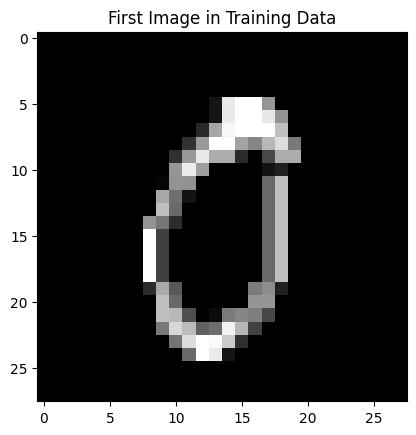

In [ ]:
#show image from training data
plt.imshow(X_train[0], cmap='gray')
plt.title('First Image in Training Data')
plt.show()

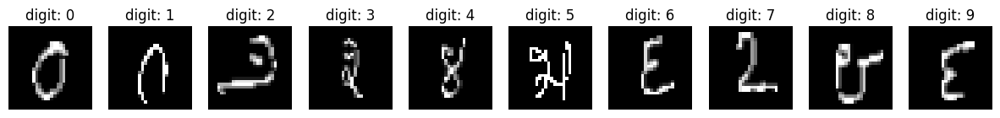

In [ ]:
# Display the first 10 images side by side
num_images_to_display = 10

fig, axes = plt.subplots(1, num_images_to_display, figsize=(15, 3))

for i in range(num_images_to_display):
    axes[i].imshow(X_train[i], cmap='gray')
    axes[i].set_title(f'digit: {y_train[i]}')
    axes[i].axis('off')

plt.show()

In [ ]:
# Flatten the image data
def flatten_data(data):
    return data.reshape(data.shape[0], -1)

X_train = flatten_data(X_train)



<h2>The real Machine Learning starts from here</h2>

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=1/7.0 , random_state=0)

In [ ]:
from sklearn.svm import SVC
model = SVC(probability=True)
model.fit(X_train, y_train)

SVC(probability=True)

In [ ]:
y_pred = model.predict(X_test)

In [ ]:
model.score(X_test, y_test)

0.9867973322444535

In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_pred, y_test)

0.9867973322444535

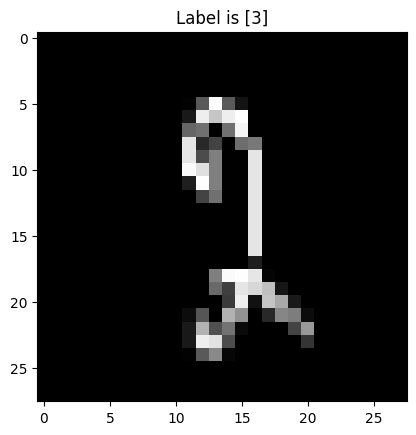

In [ ]:
y_predicted = model.predict(X_test[1].reshape(1,-1))
label = y_predicted
pixel = X_test[1]
pixel = np.array(pixel, dtype='uint8')
pixel = pixel.reshape((28,28))
plt.title('Label is {label}'.format(label=label))
plt.imshow(pixel, cmap='gray')
plt.show()

In [ ]:
from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier()
model.fit(X_train, y_train)

RandomForestClassifier()

In [ ]:
y_pred = model.predict(X_test)

In [ ]:
model.score(X_test, y_test)

0.9798348682121308

In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_pred, y_test)

0.9798348682121308

In [ ]:
X_test[8]

In [ ]:
y_test[8]

9

In [ ]:
y_predicted = model.predict(X_test[8].reshape(1,-1))

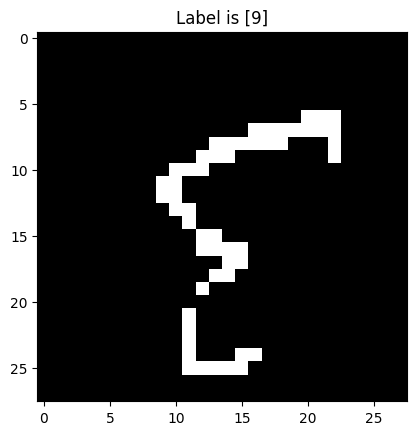

In [ ]:
label = y_predicted
pixel = X_test[8]
pixel = np.array(pixel, dtype='uint8')
pixel = pixel.reshape((28,28))
plt.title('Label is {label}'.format(label=label))
plt.imshow(pixel, cmap='gray')
plt.show()